# Interpreting What Convnets Learn

## Visualizing Intermediate Activations

**Loading the model saved in section 8.2(HW4)**

In [1]:
# Load HW04 model
from tensorflow import keras
model = keras.models.load_model("convnet_from_scratch_with_augmentation.keras") 
model.summary()

Metal device set to: Apple M1 Pro


2023-11-03 15:47:47.016554: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-11-03 15:47:47.016688: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 sequential_12 (Sequential)  (None, 180, 180, 3)       0         
                                                                 
 rescaling_5 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_25 (Conv2D)          (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 89, 89, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 87, 87, 64)        18496     
                                                           

**Preprocessing a single image**

In [2]:
# Image pre-processing
from tensorflow import keras 
import numpy as np
img_path = keras.utils.get_file( 
    fname="cat.jpg",
    origin="https://img-datasets.s3.amazonaws.com/cat.jpg")
def get_img_array(img_path, target_size): 
    img = keras.utils.load_img( 
        img_path, target_size=target_size)   
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0) 
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

**Displaying the test picture**

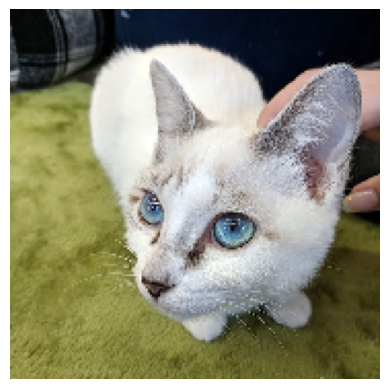

In [3]:
# Displaying the test picture
import matplotlib.pyplot as plt
plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

**Instantiating a model that returns layer activations**

In [4]:
from tensorflow.keras import layers 
layer_outputs = []
layer_names = [] 
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):  
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)

activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

**Using the model to compute layer activations**

In [5]:
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

1/1 [==============================] - 0s 68ms/step
(1, 178, 178, 32)


2023-11-03 15:47:47.966944: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-11-03 15:47:47.999401: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


**Visualizing the fifth channel**

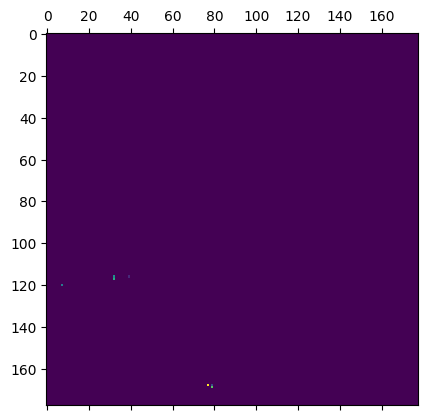

In [6]:
# Visualizing the fifth channel
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 5], cmap="viridis")

**Visualizing every channel in every intermediate activation**

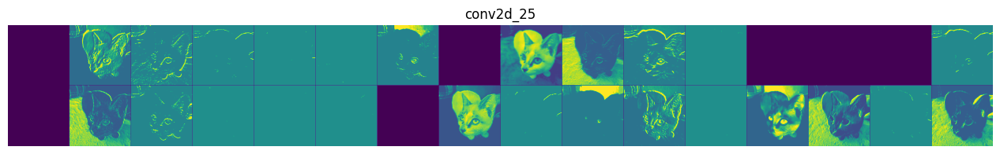

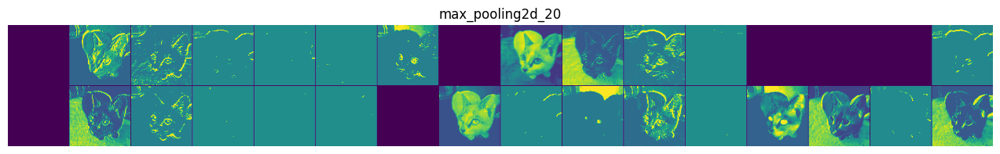

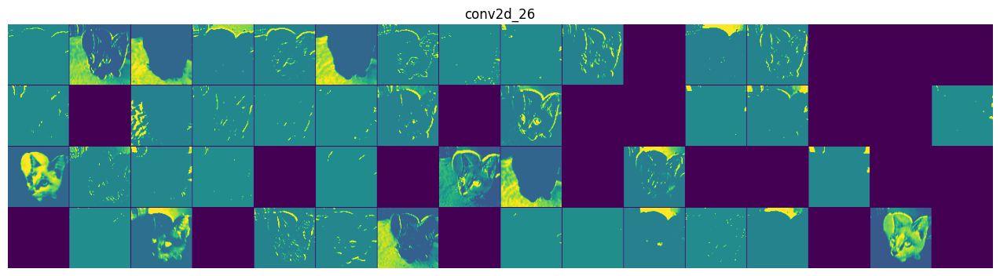

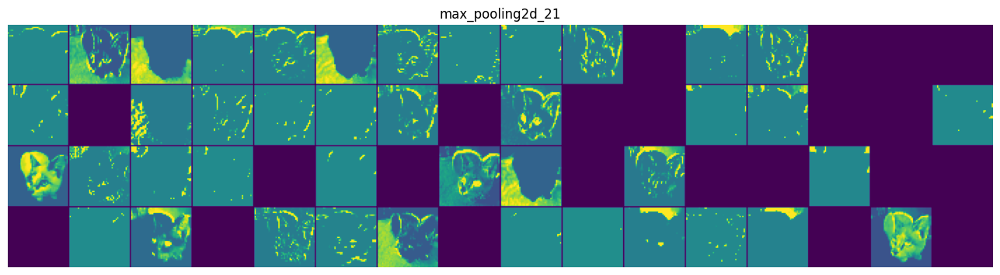

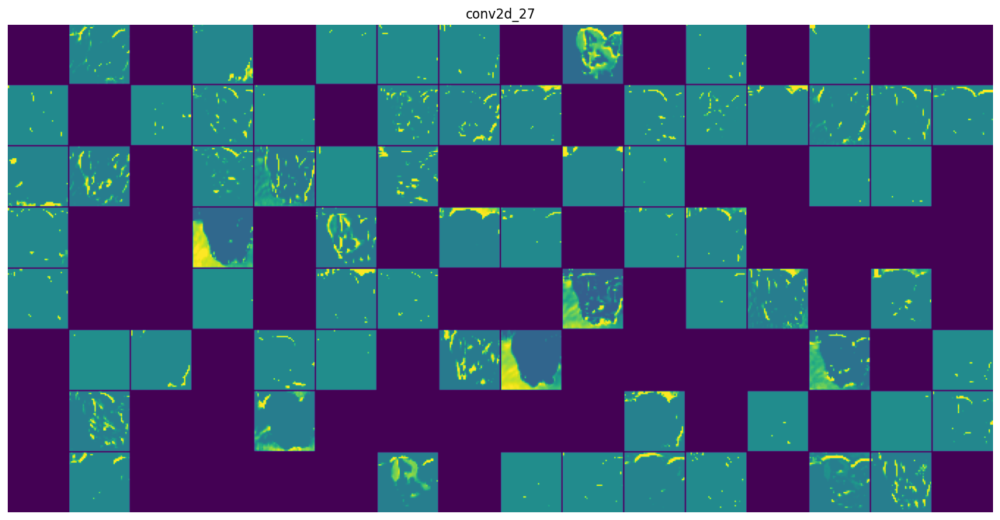

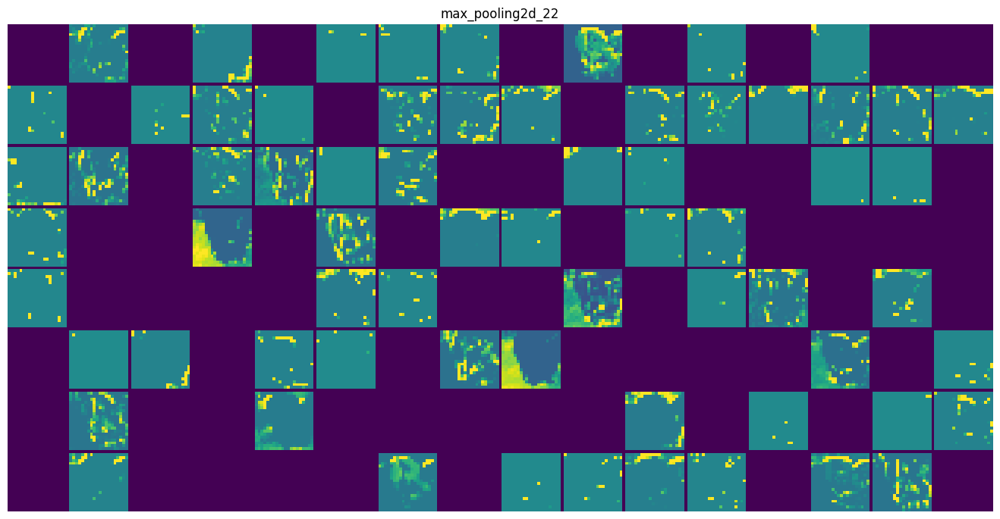

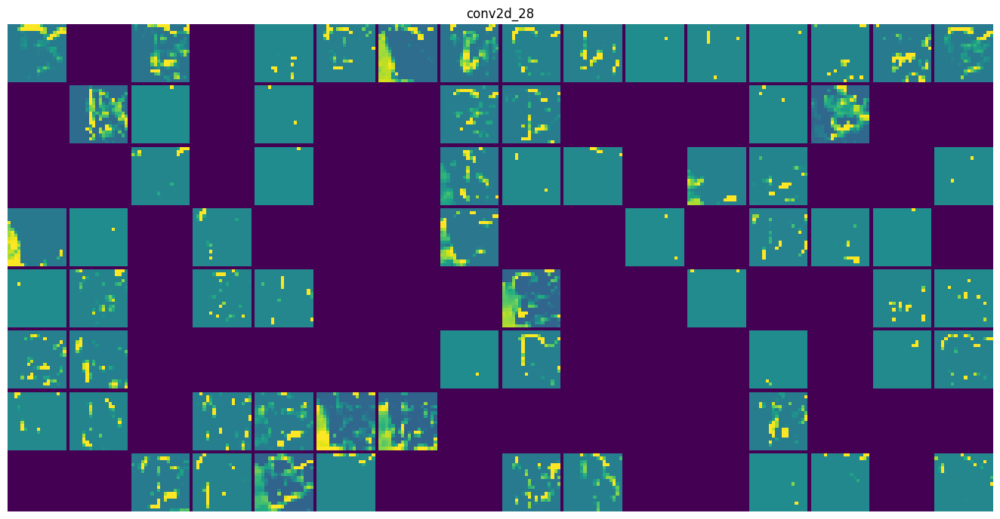

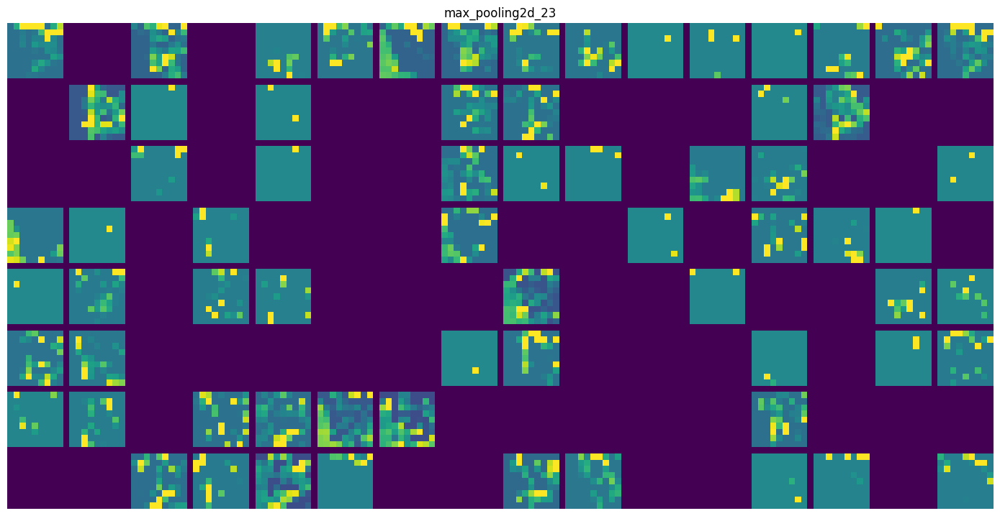

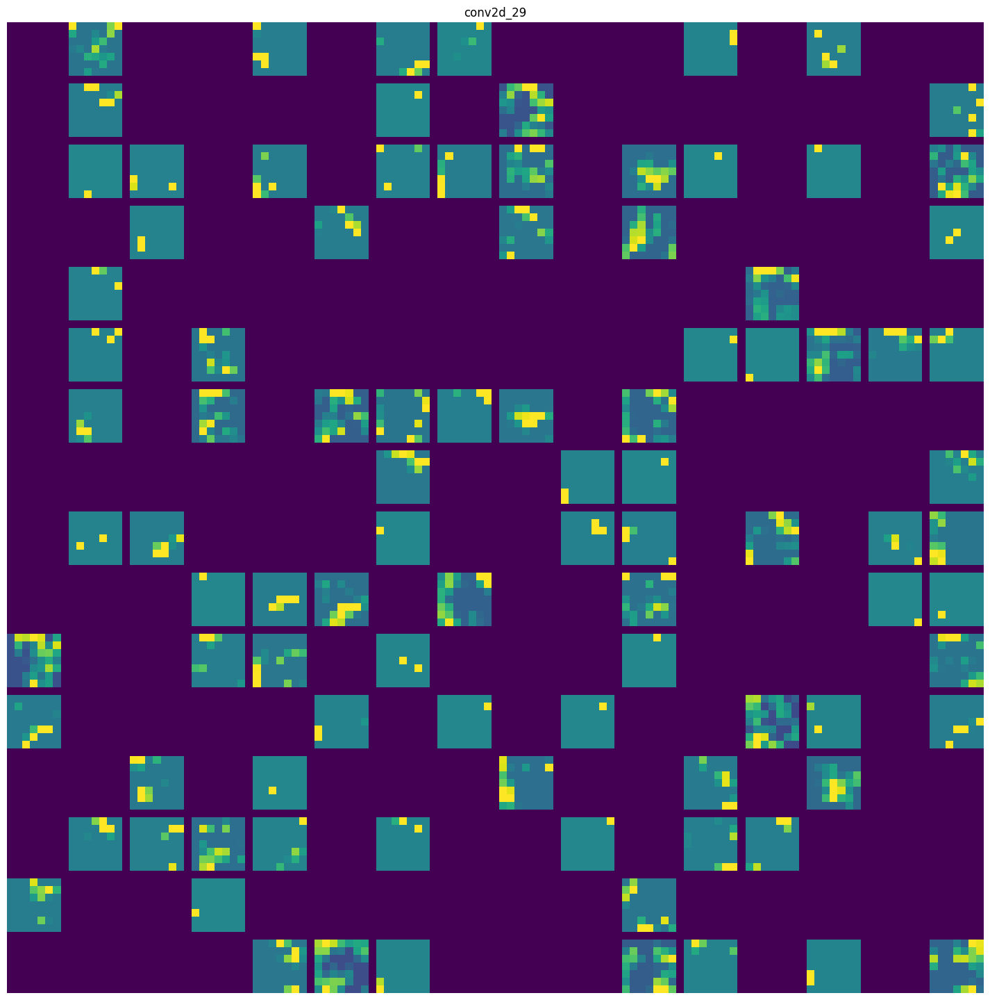

In [7]:
# Visualizing every channel in every intermediate activation
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

## Visualizing Convnet Filters

**Instantiating the Xception convolutional base**

In [8]:
model = keras.applications.xception.Xception(
    weights="imagenet", 
    include_top=False)

**Printing the names of all convolutional layers in Xception**

In [9]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)): 
        print(layer.name)

block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d
block3_sepconv1
block3_sepconv2
conv2d_1
block4_sepconv1
block4_sepconv2
conv2d_2
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_3
block14_sepconv1
block14_sepconv2


**Creating a feature extractor model**

In [10]:
layer_name = "block3_sepconv1"
layer = model.get_layer(name=layer_name)   
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

**Using the feature extractor**

In [11]:
activation = feature_extractor(
keras.applications.xception.preprocess_input(img_tensor) 
)

**Loss maximization via stochastic gradient ascent**

In [12]:
import tensorflow as tf

def compute_loss(image, filter_index):  
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index] 
    return tf.reduce_mean(filter_activation)

@tf.function
def gradient_ascent_step(image, filter_index, learning_rate): 
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image) 
    grads = tf.math.l2_normalize(grads) 
    image += learning_rate * grads
    return image

**Function to generate filter visualizations**

In [13]:
img_width = 200 
img_height = 200

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform( 
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3)) 
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)  
    return image[0].numpy()


**Utility function to convert a tensor into a valid image**

2023-11-03 15:47:50.177508: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


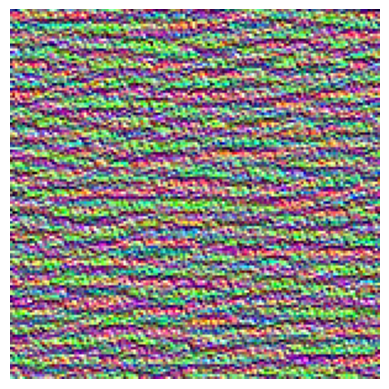

In [14]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :] 
    return image

plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

**Generating a grid of all filter response patterns in a layer**

In [15]:
all_images = []
for filter_index in range(64):
    print(f"Processing filter {filter_index}") 
    image = deprocess_image(
        generate_filter_pattern(filter_index) 
    )
    all_images.append(image)

margin = 5 
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin 
height = n * cropped_height + (n - 1) * margin 
stitched_filters = np.zeros((width, height, 3))

for i in range(n): 
    for j in range(n):
        image = all_images[i * n + j] 
        row_start = (cropped_width + margin) * i
        row_end = (cropped_width + margin) * i + cropped_width 
        column_start = (cropped_height + margin) * j
        column_end = (cropped_height + margin) * j + cropped_height 
        
        stitched_filters[
            row_start: row_end,
            column_start: column_end, :] = image

keras.utils.save_img(  
    f"filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0


2023-11-03 15:47:50.509179: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 1


2023-11-03 15:47:50.753498: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 2
Processing filter 3


2023-11-03 15:47:51.131815: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 4


2023-11-03 15:47:51.367689: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 5


2023-11-03 15:47:51.600453: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 6


2023-11-03 15:47:51.835420: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 7


2023-11-03 15:47:52.063601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 8


2023-11-03 15:47:52.305413: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 9


2023-11-03 15:47:52.542212: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 10


2023-11-03 15:47:52.786949: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 11


2023-11-03 15:47:53.029017: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 12


2023-11-03 15:47:53.265447: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 13


2023-11-03 15:47:53.513478: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 14


2023-11-03 15:47:53.747247: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 15


2023-11-03 15:47:53.991157: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 16


2023-11-03 15:47:54.255790: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 17


2023-11-03 15:47:54.524080: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 18


2023-11-03 15:47:54.804408: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 19


2023-11-03 15:47:55.073471: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 20


2023-11-03 15:47:55.336699: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 21


2023-11-03 15:47:55.610317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 22


2023-11-03 15:47:55.878931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 23


2023-11-03 15:47:56.139470: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 24


2023-11-03 15:47:56.400533: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 25


2023-11-03 15:47:56.665798: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 26


2023-11-03 15:47:56.931432: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 27


2023-11-03 15:47:57.196559: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 28


2023-11-03 15:47:57.450378: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 29


2023-11-03 15:47:57.704097: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 30


2023-11-03 15:47:58.032124: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 31


2023-11-03 15:47:58.304903: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 32


2023-11-03 15:47:58.595899: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 33


2023-11-03 15:47:58.898741: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 34


2023-11-03 15:47:59.153414: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 35


2023-11-03 15:47:59.450868: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 36


2023-11-03 15:47:59.743999: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 37


2023-11-03 15:48:00.038559: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 38


2023-11-03 15:48:00.334035: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 39


2023-11-03 15:48:00.629278: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 40


2023-11-03 15:48:00.933594: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 41


2023-11-03 15:48:01.229484: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 42


2023-11-03 15:48:01.528110: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 43


2023-11-03 15:48:01.832320: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 44


2023-11-03 15:48:02.142121: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 45


2023-11-03 15:48:02.444193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 46


2023-11-03 15:48:02.750273: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 47


2023-11-03 15:48:03.100241: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 48


2023-11-03 15:48:03.410268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 49


2023-11-03 15:48:03.705844: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 50


2023-11-03 15:48:04.010451: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 51


2023-11-03 15:48:04.301459: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 52


2023-11-03 15:48:04.596290: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 53


2023-11-03 15:48:04.893135: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 54


2023-11-03 15:48:05.186504: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 55


2023-11-03 15:48:05.477833: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 56


2023-11-03 15:48:05.770057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 57


2023-11-03 15:48:06.058901: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 58


2023-11-03 15:48:06.344080: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 59


2023-11-03 15:48:06.639036: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 60


2023-11-03 15:48:06.924570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 61


2023-11-03 15:48:07.210733: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 62


2023-11-03 15:48:07.492286: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Processing filter 63


2023-11-03 15:48:07.776638: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


**saved image**

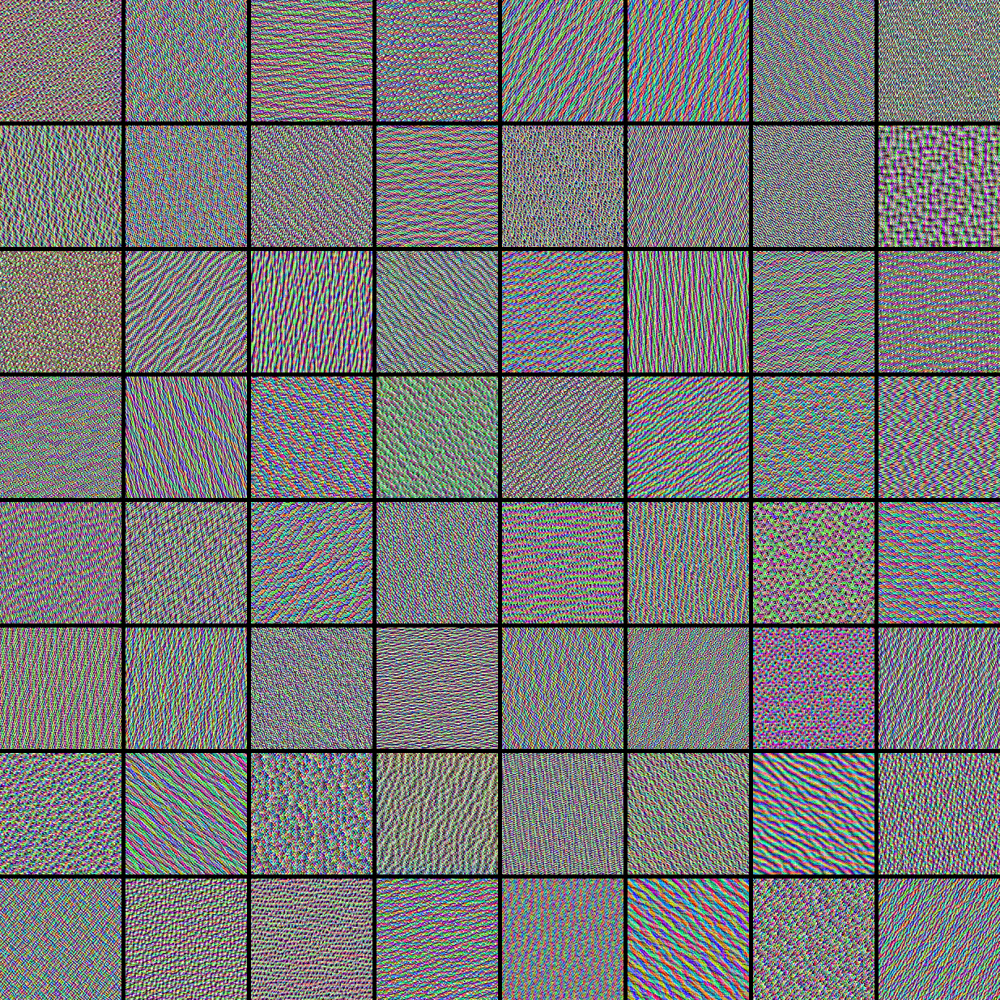

## Visualizing Heatmaps Of Class Activation

**Loading the Xception network with pretrained weights**

In [16]:
model = keras.applications.xception.Xception(weights="imagenet")

**Preprocessing an input image for Xception**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


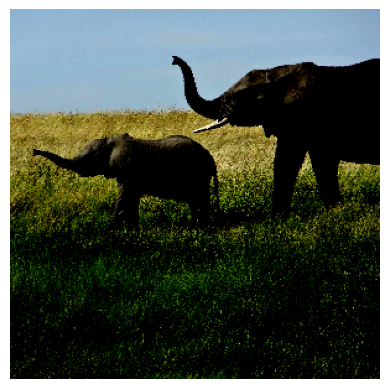

In [17]:
img_path = keras.utils.get_file( 
    fname="elephant.jpg",
    origin="https://img-datasets.s3.amazonaws.com/elephant.jpg")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)  
    array = keras.utils.img_to_array(img)  
    array = np.expand_dims(array, axis=0)
    array = keras.applications.xception.preprocess_input(array)  
    return array

img_array = get_img_array(img_path, target_size=(299, 299))

#visualization of image
plt.axis("off")
plt.imshow(img_array[0])
plt.show()

**Setting up a model that returns the last convolutional output**

In [18]:
last_conv_layer_name = "block14_sepconv2_act" 
classifier_layer_names = [
    "avg_pool", 
    "predictions",
]

last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

**Reapplying the classifier on top of the last convolutional output**

In [19]:
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:]) 
x = classifier_input 
for layer_name in classifier_layer_names: 
    x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

**Retrieving the gradients of the top predicted class**

In [20]:
import tensorflow as tf
  
with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(img_array) 
    tape.watch(last_conv_layer_output)  
    preds = classifier_model(last_conv_layer_output)  
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index] 

grads = tape.gradient(top_class_channel, last_conv_layer_output)

**Gradient pooling and channel-importance weighting**

In [21]:
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy() 
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]   
heatmap = np.mean(last_conv_layer_output, axis=-1)

**Heatmap post-processing**

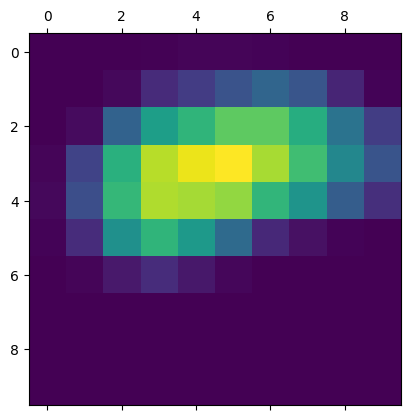

In [22]:
heatmap = np.maximum(heatmap, 0) 
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

**Superimposing the heatmap on the original picture**

In [23]:
import matplotlib.cm as cm
img = keras.utils.load_img(img_path)  
img = keras.utils.img_to_array(img)

heatmap = np.uint8(255 * heatmap)

jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap] 

jet_heatmap = keras.utils.array_to_img(jet_heatmap)    
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)    

superimposed_img = jet_heatmap * 0.4 + img 
superimposed_img = keras.utils.array_to_img(superimposed_img) 

save_path = "elephant_cam.jpg" 
superimposed_img.save(save_path)


/var/folders/q0/z941gqb53xd_9gg0dns_5ldr0000gn/T/ipykernel_69821/2938549960.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


**saved image**
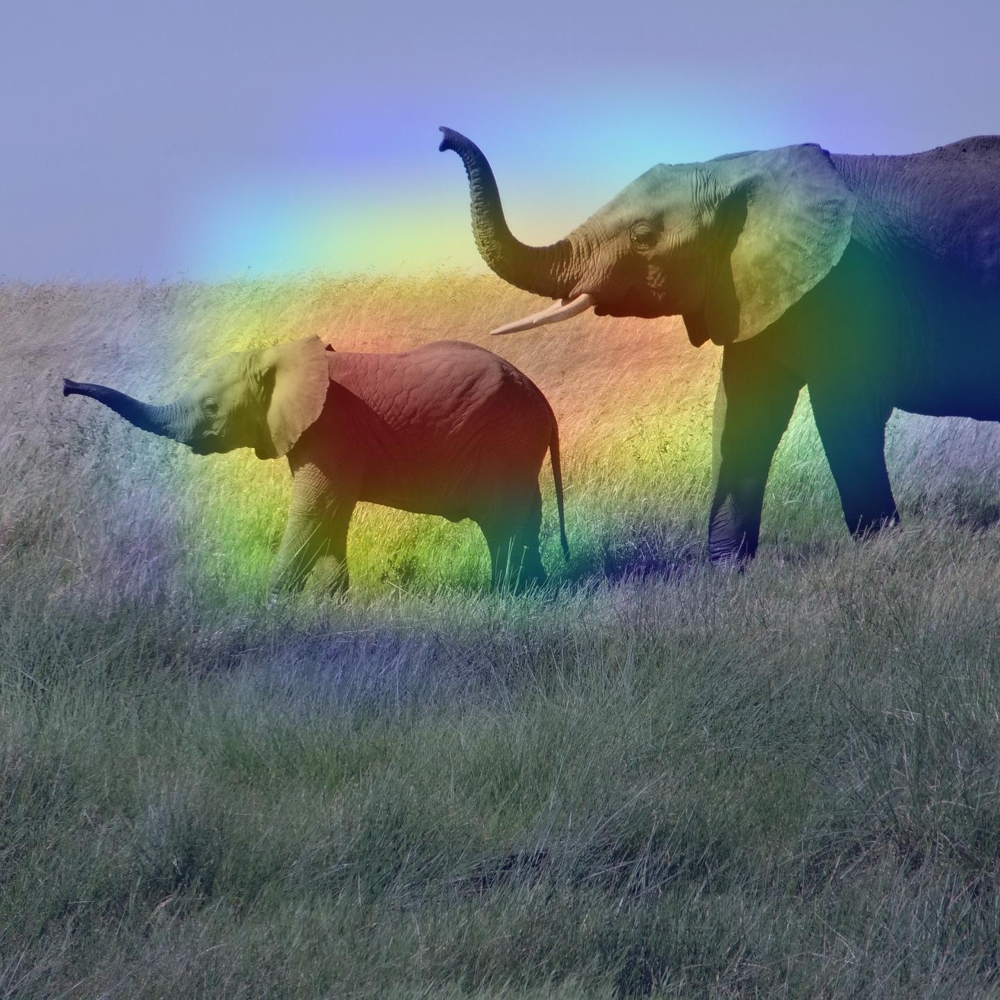

### Additional Experiment

In [24]:
img_path

'/Users/yuseonchoi/.keras/datasets/elephant.jpg'

In [25]:
img_path = keras.utils.get_file( 
    fname="bichon.jpg",
    origin="https://images.mypetlife.co.kr/content/uploads/2017/12/09160633/Dognews-1.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


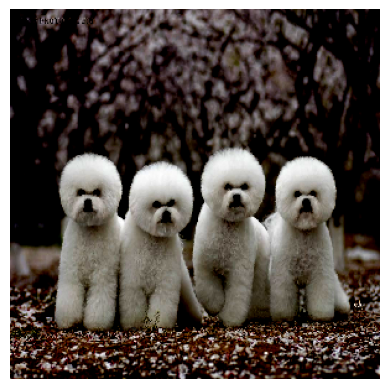

In [26]:
def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)  
    array = keras.utils.img_to_array(img)  
    array = np.expand_dims(array, axis=0)
    array = keras.applications.xception.preprocess_input(array)  
    return array

img_array = get_img_array(img_path, target_size=(299, 299))

#visualization of image
plt.axis("off")
plt.imshow(img_array[0])
plt.show()

In [27]:
# 마지막 convolution layer 출력을 반환하는 Model 생성
last_conv_layer_name = "block14_sepconv2_act" 
classifier_layer_names = [
    "avg_pool", 
    "predictions",
]

last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

# classifier에 적용하기 위한 모델 생성
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:]) 
x = classifier_input 
for layer_name in classifier_layer_names: 
    x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

import tensorflow as tf
  
with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(img_array) 
    tape.watch(last_conv_layer_output)  
    preds = classifier_model(last_conv_layer_output)  
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index] 

grads = tape.gradient(top_class_channel, last_conv_layer_output)

pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy() 
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]   
heatmap = np.mean(last_conv_layer_output, axis=-1)

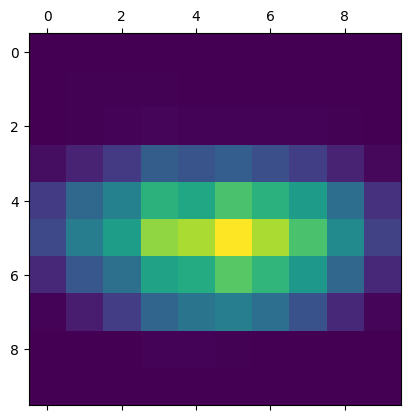

In [28]:
heatmap = np.maximum(heatmap, 0) 
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [29]:
# 원본 이미지 위에 히트맵 그리기
import matplotlib.cm as cm
img = keras.utils.load_img(img_path)  
img = keras.utils.img_to_array(img)

heatmap = np.uint8(255 * heatmap)

jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap] 

jet_heatmap = keras.utils.array_to_img(jet_heatmap)    
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)    

superimposed_img = jet_heatmap * 0.4 + img 
superimposed_img = keras.utils.array_to_img(superimposed_img) 

save_path = "bichon.jpg" 
superimposed_img.save(save_path)

/var/folders/q0/z941gqb53xd_9gg0dns_5ldr0000gn/T/ipykernel_69821/329798066.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


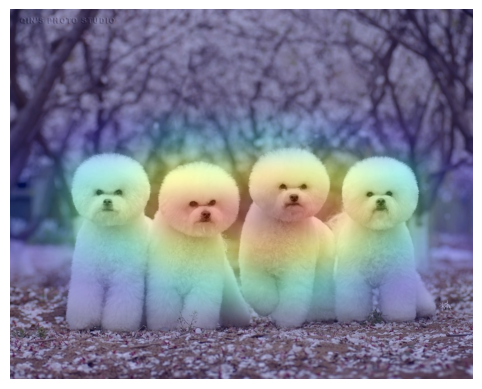

In [30]:
plt.axis("off")
plt.imshow(superimposed_img)
plt.show()